In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%pip install -r ./yolov5/requirements.txt  # install dependencies
%pip uninstall -y wandb  # open wandb bugs
%pip install xmltodict
import torch
from IPython.display import Image, clear_output
import xml.etree.ElementTree as ET
import xmltodict

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [2]:
dataname='facemaskdetection'
classes = ["with_mask", "without_mask", "mask_weared_incorrect"]

In [3]:
import shutil
import os
import pandas as pd
from tqdm import tqdm
import glob

train_dir = 'train'
val_dir = 'val'
test_dir = 'test'

for dir_name in [train_dir, val_dir, test_dir]:
    os.makedirs(os.path.join('yolov5', dataname, 'images', dir_name), exist_ok=True)
source_dir  = os.path.join("../input/militaryaircraftdetectiondataset/dataset")

for dir_name in [train_dir, val_dir, test_dir]:
    os.makedirs(os.path.join('yolov5', dataname, 'labels', dir_name), exist_ok=True)
for i, file_path in enumerate(tqdm(glob.glob('../input/face-mask-detection/images/*.png'))):
    if i % 41 == 0:
        dest_dir_im = os.path.join('yolov5', dataname, 'images', test_dir)
        dest_dir_la = os.path.join('yolov5', dataname, 'labels', test_dir)
    elif i % 17 != 0:
        dest_dir_im  = os.path.join('yolov5', dataname, 'images', train_dir)
        dest_dir_la  = os.path.join('yolov5', dataname, 'labels', train_dir)
    else:
        dest_dir_im  = os.path.join('yolov5', dataname, 'images', val_dir)
        dest_dir_la  = os.path.join('yolov5', dataname, 'labels', val_dir)
    shutil.copy(os.path.join(file_path), os.path.join(dest_dir_im, file_path[36:]))
    
    tree = ET.parse("../input/face-mask-detection/annotations/" + file_path[36:-3] + "xml")
    root = tree.getroot()
    xmlstr = ET.tostring(root, encoding='utf8', method='xml')
    xml_dict = (xmltodict.parse(xmlstr))
    width_img = int(xml_dict['annotation']['size']['width'])
    height_img = int(xml_dict['annotation']['size']['height'])
    with open(os.path.join(dest_dir_la, file_path[36:-3] + "txt"), "w+") as f:
        if type(xml_dict['annotation']['object']) is list:
            for obj in xml_dict['annotation']['object']:
                xmin = int(obj['bndbox']['xmin'])/width_img
                ymin = int(obj['bndbox']['ymin'])/height_img
                xmax = int(obj['bndbox']['xmax'])/width_img
                ymax = int(obj['bndbox']['ymax'])/height_img

                width  = xmax - xmin
                height = ymax - ymin
                xfullc = xmin + (width/2)
                yfullc = ymin + (height/2)
                if obj['name'] == 'with_mask': class_label = 0
                elif obj['name'] == 'without_mask': class_label = 1
                else: class_label = 2

                f.write("{0} {1} {2} {3} {4}\r\n".format(class_label, xfullc, yfullc, width, height))
        else:
                xmin = int(xml_dict['annotation']['object']['bndbox']['xmin'])/width_img
                ymin = int(xml_dict['annotation']['object']['bndbox']['ymin'])/height_img
                xmax = int(xml_dict['annotation']['object']['bndbox']['xmax'])/width_img
                ymax = int(xml_dict['annotation']['object']['bndbox']['ymax'])/height_img

                width  = xmax - xmin
                height = ymax - ymin
                xfullc = xmin + (width/2)
                yfullc = ymin + (height/2)
                if xml_dict['annotation']['object']['name'] == 'with_mask': class_label = 0
                elif xml_dict['annotation']['object']['name'] == 'without_mask': class_label = 1
                else: class_label = 2

                f.write("{0} {1} {2} {3} {4}\r\n".format(class_label, xfullc, yfullc, width, height))

100%|██████████| 853/853 [00:19<00:00, 43.23it/s]


In [4]:
datayamlstring='''
# train and val data as 1) directory: path/images/, 2) file: path/images.txt, or 3) list: [path1/images/, path2/images/]
train: ./facemaskdetection/images/train
val: ./facemaskdetection/images/val

# number of classes
nc: 3

# class names
names: [0, 1, 2]
'''
with open("./yolov5/data/data.yaml", "w+") as f:
    f.write(datayamlstring)

In [5]:
hypyamlstring='''
lr0: 0.05  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
'''
with open("./yolov5/hyp.yaml", "w+") as f:
    f.write(hypyamlstring)

In [6]:
%cd yolov5
!python train.py --img 480 --batch 64 --epochs 100 --data data.yaml --hyp hyp.yaml --weights yolov5m.pt

/kaggle/working/yolov5
github: up to date with https://github.com/ultralytics/yolov5 ✅
2021-02-19 16:22:53.946046: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.2
100%|██████████████████████████████████████| 41.1M/41.1M [00:01<00:00, 22.6MB/s]

train: Scanning 'facemaskdetection/labels/train' for images and labels... 783 fo
val: Scanning 'facemaskdetection/labels/val' for images and labels... 49 found, 
Plotting labels... 

autoanchor: Analyzing anchors... anchors/target = 5.22, Best Possible Recall (BPR) = 0.9984
      0/99     8.86G     0.112   0.04727   0.03432    0.1936       104       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223     0.00638      0.0188     0.00057     0.00017
      1/99     14.3G   0.09608   0.05327   0.02579    0.1751       101       480
               Class      Images     Targets           P           R      

     29/99     14.3G   0.04261   0.02476  0.005003   0.07237       140       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.823        0.78       0.813       0.516
     30/99     14.3G   0.04149   0.02489  0.004876   0.07126       106       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.623       0.734       0.693       0.425
     31/99     14.3G   0.04103   0.02545  0.005324   0.07181       108       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.695       0.645       0.601       0.307
     32/99     14.3G   0.03989   0.02486  0.005034   0.06979       174       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.697       0.755     

     61/99     14.3G   0.02935   0.02211  0.002468   0.05393       135       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.807       0.664       0.685       0.446
     62/99     14.3G   0.02937   0.02309   0.00229   0.05476       170       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.938       0.751       0.831       0.532
     63/99     14.3G   0.02843   0.02169  0.002157   0.05228       119       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.985       0.721       0.809       0.541
     64/99     14.3G   0.02779   0.02132  0.002132   0.05124       108       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.935       0.764     

     93/99     14.3G   0.02051   0.01785    0.0014   0.03977       111       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223        0.95        0.77       0.836       0.558
     94/99     14.3G   0.02102   0.01864  0.001407   0.04106       217       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.976       0.782       0.809       0.563
     95/99     14.3G   0.02049   0.01852  0.001543   0.04056       158       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.956       0.754       0.817       0.542
     96/99     14.3G   0.01987   0.01728  0.001275   0.03842       138       480
               Class      Images     Targets           P           R      mAP@.5
                 all          49         223       0.932       0.773     

In [7]:
%cp runs/train/exp/weights/best.pt ./

In [8]:
!python detect.py --weights best.pt \
                  --img 480 \
                  --conf 0.4 \
                  --iou-thres 0.4 \
                  --agnostic-nms \
                  --augment \
                  --source ./facemaskdetection/images/test \
                  --name inference_test

Namespace(agnostic_nms=True, augment=True, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=480, iou_thres=0.4, name='inference_test', project='runs/detect', save_conf=False, save_txt=False, source='./facemaskdetection/images/test', update=False, view_img=False, weights=['best.pt'])
Fusing layers... 
image 1/21 /kaggle/working/yolov5/facemaskdetection/images/test/maksssksksss1.png: 192x480 7 0s, 1 1, Done. (0.048s)
image 2/21 /kaggle/working/yolov5/facemaskdetection/images/test/maksssksksss167.png: 256x480 4 0s, Done. (0.041s)
image 3/21 /kaggle/working/yolov5/facemaskdetection/images/test/maksssksksss176.png: 288x480 10 0s, 3 1s, Done. (0.042s)
image 4/21 /kaggle/working/yolov5/facemaskdetection/images/test/maksssksksss184.png: 288x480 17 0s, Done. (0.041s)
image 5/21 /kaggle/working/yolov5/facemaskdetection/images/test/maksssksksss274.png: 320x480 1 0, Done. (0.041s)
image 6/21 /kaggle/working/yolov5/facemaskdetection/images/test/maksssksksss296.png: 288x480 28 0s, 1

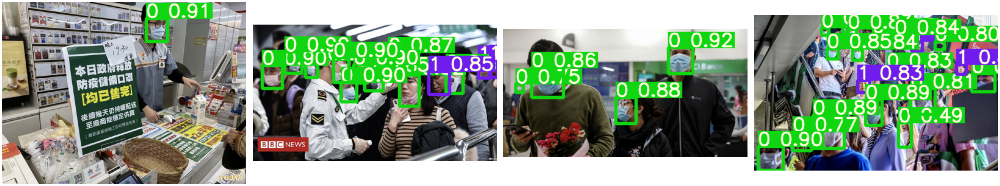

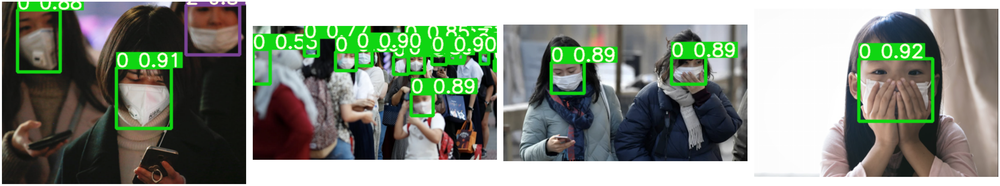

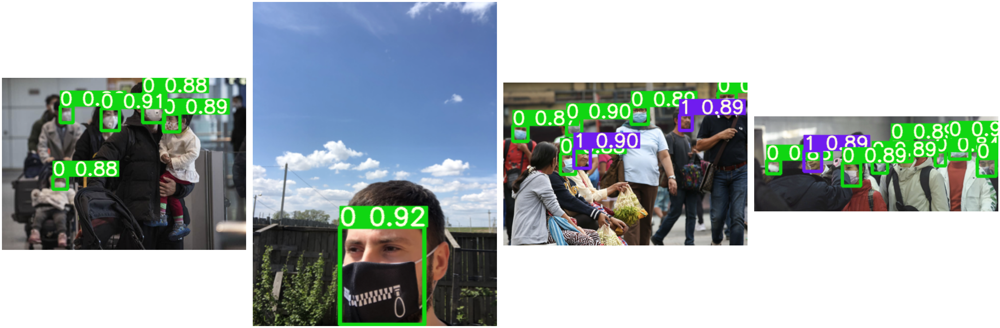

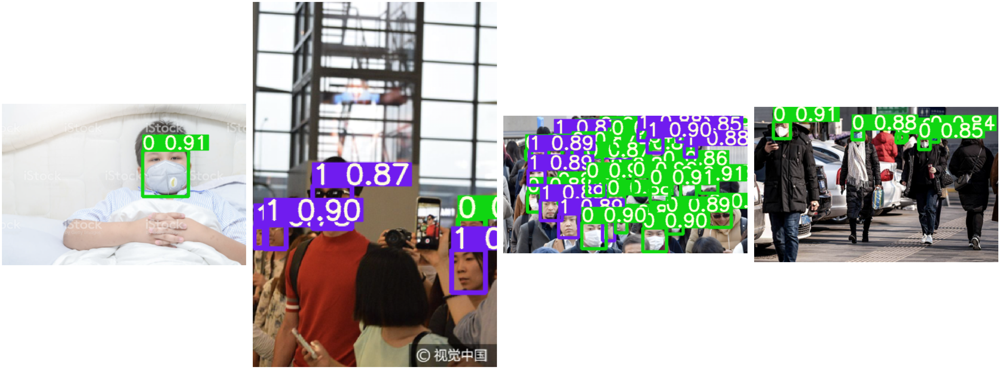

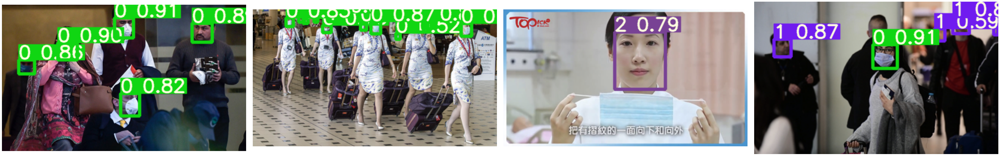

In [9]:
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline
for i, img_name in enumerate(glob.glob('runs/detect/inference_test/*.png')[:-1]):
    img = Image.open(str(img_name))
    if i % 4 == 0:
        fig, axs = plt.subplots(1, 4, figsize=(50, 20), constrained_layout=True)
    axs[i%4].imshow(img)
    axs[i%4].grid(False)
    axs[i%4].axis('off')

In [10]:
'''
%cd /kaggle/working
%mv yolov5/runs/detect/inference_test/ ./output
!rm -r yolov5
'''

'\n%cd /kaggle/working\n%mv yolov5/runs/detect/inference_test/ ./output\n!rm -r yolov5\n'